# Object detection for driverless vehicles

## Setup

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15853, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 15853 (delta 37), reused 35 (delta 8), pack-reused 15769
Receiving objects: 100% (15853/15853), 14.60 MiB | 11.51 MiB/s, done.
Resolving deltas: 100% (10851/10851), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 605.6/605.6 kB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 4.7 MB/s eta 0:

In [ ]:
from roboflow import Roboflow


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

## Get dataset from Roboflow

In [ ]:
rf = Roboflow(api_key="odlXEsaeA7E8Blk8d0Ub")
project = rf.workspace("yash-jonjale-by4sx").project("detector-jazec")
dataset = project.version(1).download("yolov5")



loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/detector-1 in yolov5pytorch:: 100%|██████████| 22522/22522 [00:04<00:00, 5016.59it/s]


## Train The Yolo Model








In [ ]:
!python train.py --img 256 --batch 16 --epochs 35 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/detector-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=35, batch_size=16, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-200-g05e4c05 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.0

## Show Training Results

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Prediction

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.5 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/detector-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-200-g05e4c05 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/564 /content/datasets/detector-1/valid/images/006_png_jpg.rf.c746dbb41b3d7b966738e565b75779a1.jpg: 640x640 5 potholes, 11.5ms
image 2/564 /content/datasets/detector-1/valid/images/009_png_jpg.rf.45f47fdc16a6d90333d7946106a56f77.jpg: 640x640 6 potholes, 11.6ms
image 3/564 /content/datasets/detector-1/

## Display Inference Images

/content/yolov5/runs/detect/exp2/499_png_jpg.rf.07e3107d6a5e8f096eeed6d301f0f102.jpg


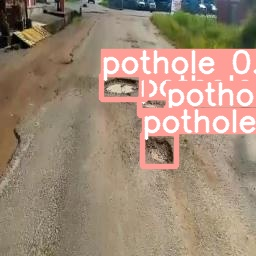



/content/yolov5/runs/detect/exp2/img-142_jpg.rf.9d1a36970efa8fd7896cb69890a07e2f.jpg


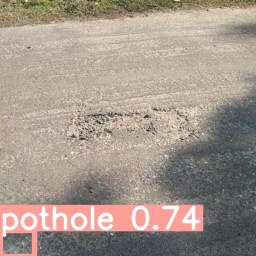



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103ee1115bfb97dc_d20170226_m033722_c001_v0001038_t0047_png_jpg.rf.b40e45be81ea7fa1189a156eccc07ea0.jpg


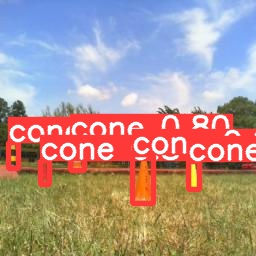



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f112c94dfdc9dca23_d20161224_m022421_c001_v0001036_t0024_png_jpg.rf.b9bb061e165b60386f161976102a5deb.jpg


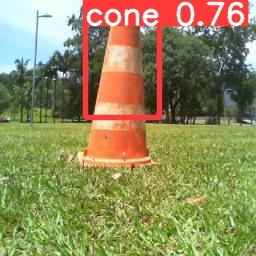



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103ee1115bfb93d5_d20170226_m033425_c001_v0001038_t0047_png_jpg.rf.6748795050e29a25915692d8f7518285.jpg


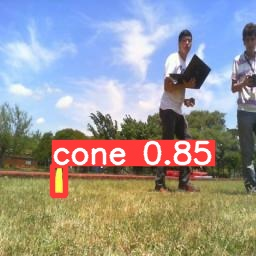



/content/yolov5/runs/detect/exp2/img-599_jpg.rf.71a9d593ce8201bf7039a0c468cf25e7.jpg


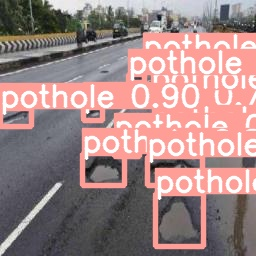



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f104a7d3ab33bf85f_d20161224_m033732_c001_v0001032_t0039_png_jpg.rf.5ad3c6344d0f8de0bc1d97717e7763bd.jpg


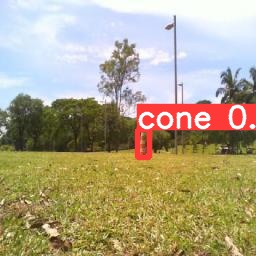



/content/yolov5/runs/detect/exp2/218_png_jpg.rf.42eb58f27ea3c3cea91a26234d34d9fd.jpg


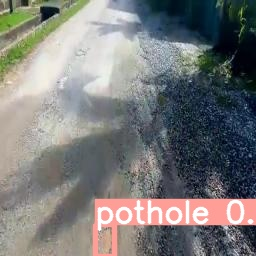



/content/yolov5/runs/detect/exp2/img-57_jpg.rf.6738e5e3b9971cc9e75f7f87ffa0824f.jpg


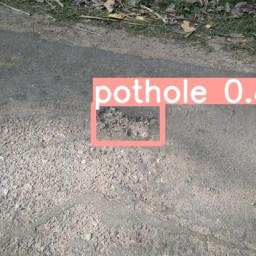



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f2452b_d20170225_m205827_c001_v0001038_t0018_png_jpg.rf.b119ad88207c6567bb5d8ebe9bb7d07d.jpg


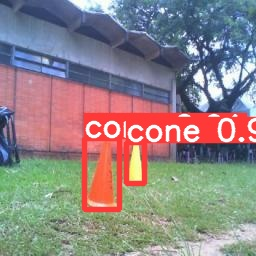



/content/yolov5/runs/detect/exp2/img-147_jpg.rf.2b09797c086c1fd1220a61d498b5c321.jpg


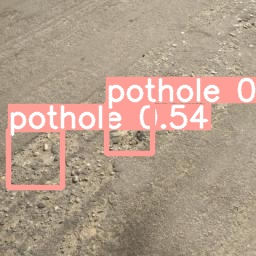



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f105bec8d65462386_d20170228_m032410_c001_v0001038_t0052_png_jpg.rf.98c4319b99dee75f73e4e05d5c2f9983.jpg


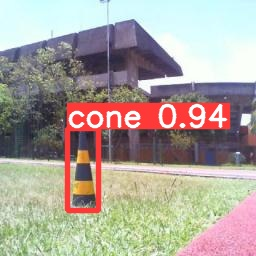



/content/yolov5/runs/detect/exp2/img-584_jpg.rf.6d729232ba6a82a1c087d2526bae14b7.jpg


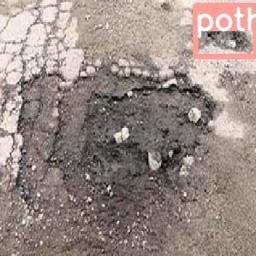



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac43933_d20170301_m023615_c001_v0001036_t0016_png_jpg.rf.81159ba6ae9e1ddf584b34b9749ab507.jpg


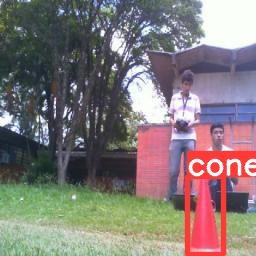



/content/yolov5/runs/detect/exp2/img-191_jpg.rf.4e0b6922fc6946f1439f1cfad8ea7474.jpg


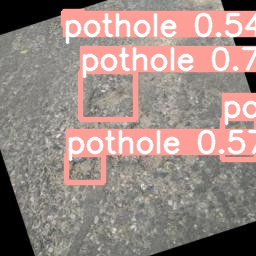



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103ee1115bfb3d7a_d20170226_m022503_c001_v0001038_t0047_png_jpg.rf.710a8546e5d406139c7601d6ab57cf00.jpg


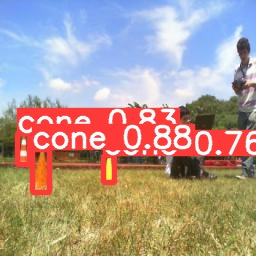



/content/yolov5/runs/detect/exp2/131_png_jpg.rf.fb9bd2d606fd39d30a9e014adff28e89.jpg


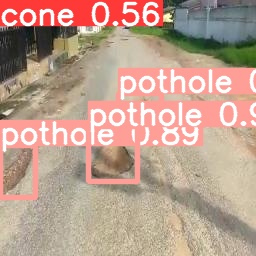



/content/yolov5/runs/detect/exp2/img-615_jpg.rf.e397a9d5a51a50ab5ee3c626dc41a5fd.jpg


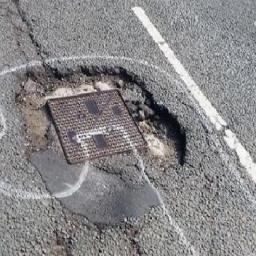



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103d1cab238019e0_d20161222_m171602_c001_v0001036_t0040_png_jpg.rf.79076ff59c4c6b1ed1f19cf7d662b29b.jpg


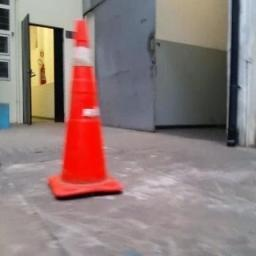



/content/yolov5/runs/detect/exp2/144_png_jpg.rf.0888b3b16e5f16dcda9f54fe4f5f3ee9.jpg


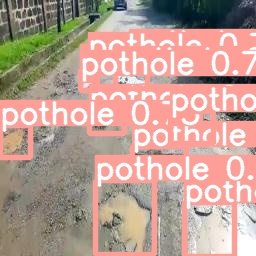



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f105bec8d6545ea18_d20170228_m023554_c001_v0001038_t0052_png_jpg.rf.055c4e2486a548328d47ac212d74b38f.jpg


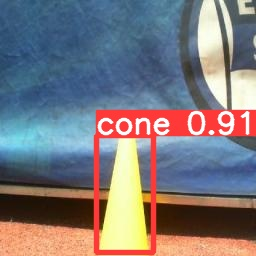



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac43ffe_d20170301_m030153_c001_v0001036_t0016_png_jpg.rf.2e43b32084ff416539138f877644f246.jpg


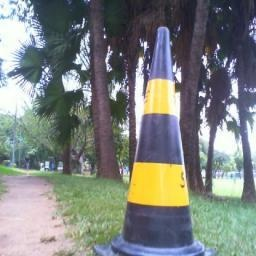



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f105bec8d6546155b_d20170228_m031201_c001_v0001038_t0052_png_jpg.rf.782f9f86f3de5fb9cddff7ab3a072353.jpg


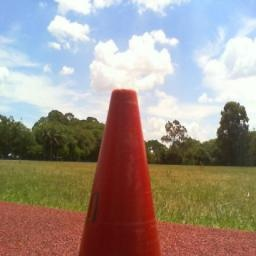



/content/yolov5/runs/detect/exp2/430_png_jpg.rf.a9427e976a29a0453d31d5a08322d984.jpg


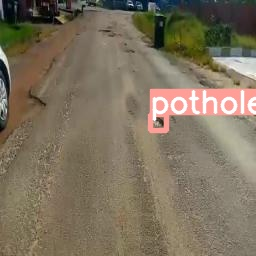



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac435ff_d20170301_m022454_c001_v0001036_t0016_png_jpg.rf.c1941590d1588c34dd56ff87768f6510.jpg


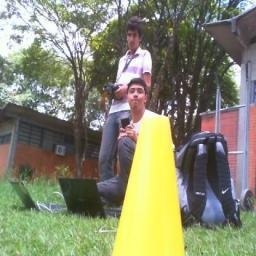



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f23242_d20170225_m203727_c001_v0001038_t0018_png_jpg.rf.c33099f414bb1cc25515f543640fd83a.jpg


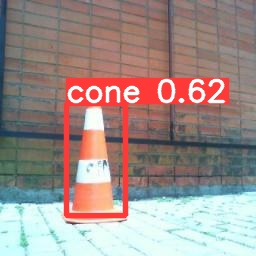



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac434dc_d20170301_m022152_c001_v0001036_t0016_png_jpg.rf.2889e8efa7eb6c90b9d7291264d2412e.jpg


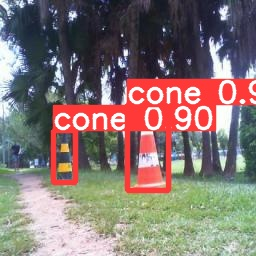



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103ee1115bfb535b_d20170226_m024317_c001_v0001038_t0047_png_jpg.rf.8cdae8b9e5b50cc32b356d40c93c6626.jpg


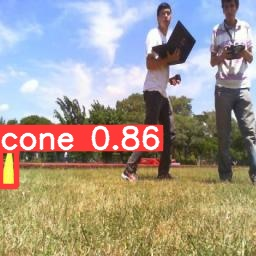



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac440d4_d20170301_m030349_c001_v0001036_t0016_png_jpg.rf.9ef2456cd3581ed3a889ecdbdd2ab297.jpg


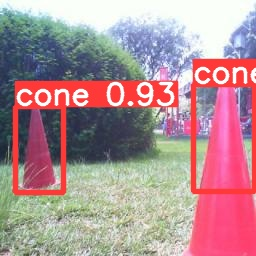



/content/yolov5/runs/detect/exp2/img-601_jpg.rf.ff7d9c15bb237e4efc476e3aa340e05f.jpg


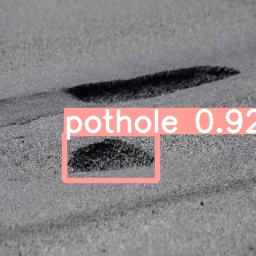



/content/yolov5/runs/detect/exp2/119_png_jpg.rf.2a3c76b41e3b67174865054e88fc10d3.jpg


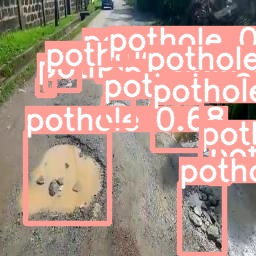



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f24b45_d20170225_m210531_c001_v0001038_t0018_png_jpg.rf.ed148fcbfe67a49fcaa2a2e1dfabf5fb.jpg


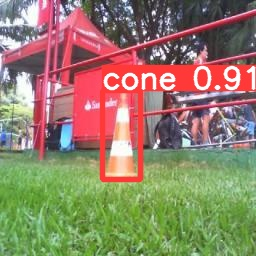



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac44bf7_d20170301_m034209_c001_v0001036_t0016_png_jpg.rf.a759bfd17e853e2a6ce2ebedb43b301f.jpg


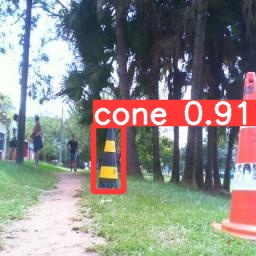



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f22aef_d20170225_m202803_c001_v0001038_t0018_png_jpg.rf.abae7aaf20c403a7a3d104c8e266c0e0.jpg


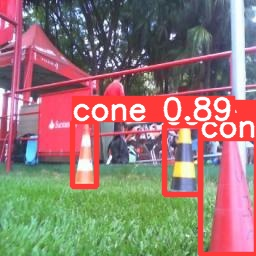



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac43c7b_d20170301_m025020_c001_v0001036_t0016_png_jpg.rf.e5edee29b95deb540f38e8f0ea01b791.jpg


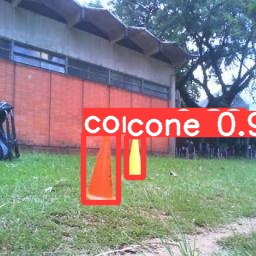



/content/yolov5/runs/detect/exp2/060_png_jpg.rf.859cf6f95cf41aa4442438ad53a340ae.jpg


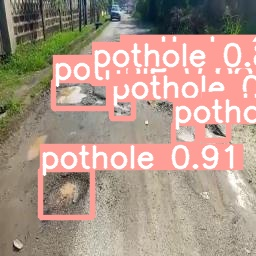



/content/yolov5/runs/detect/exp2/img-583_jpg.rf.5552b0c28140ee58019ba10118dcabec.jpg


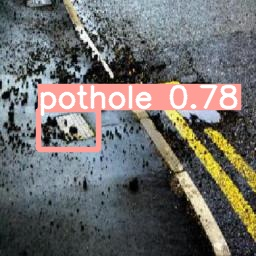



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f106fc05fedcef392_d20161224_m033935_c001_v0001037_t0049_png_jpg.rf.802daa7d4c3174efcd765171ab25940c.jpg


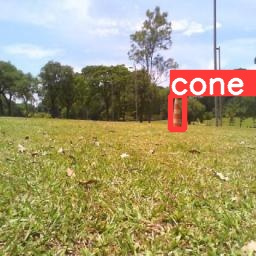



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f103ee1115bfb435d_d20170226_m022945_c001_v0001038_t0047_png_jpg.rf.9b9fc36d7d6d9dc2dd532be0e769a811.jpg


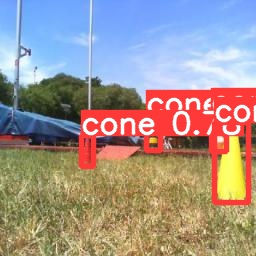



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac449b9_d20170301_m033339_c001_v0001036_t0016_png_jpg.rf.72ae78df152905b8030de6e3b5b41b89.jpg


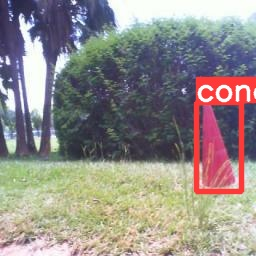



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f24b45_d20170225_m210531_c001_v0001038_t0018_png_jpg.rf.1b59356792d7de827c95776189ee55e9.jpg


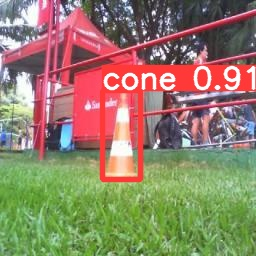



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109b3377230d49c0_d20161224_m023106_c001_v0001003_t0044_png_jpg.rf.3013568138b2fd6cf4b59e2b68ee6339.jpg


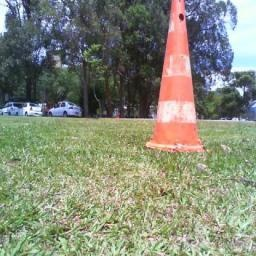



/content/yolov5/runs/detect/exp2/121_png_jpg.rf.d06e7fee4428d72df6516d62e05deba1.jpg


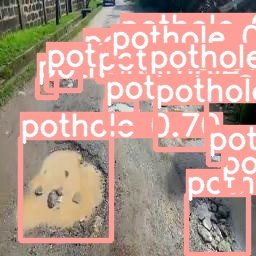



/content/yolov5/runs/detect/exp2/img-577_jpg.rf.0a05fcb7ab42c447d7a8bbb60a2f76ab.jpg


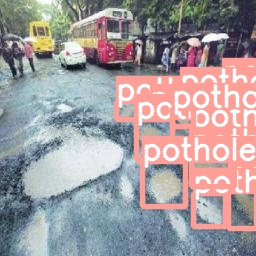



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f104a7d3ab33bf85f_d20161224_m033732_c001_v0001032_t0039_png_jpg.rf.bd323f92a423a970df3c8a8fb5cdd19d.jpg


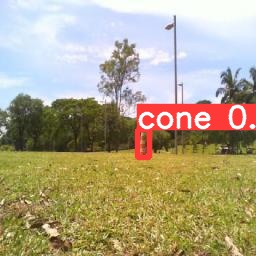



/content/yolov5/runs/detect/exp2/img-607_jpg.rf.ba3d25082a692e29ebd065b156539c0f.jpg


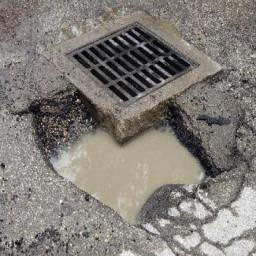



/content/yolov5/runs/detect/exp2/373_png_jpg.rf.1af44c6e96dc2da1d3abd8ab5a5b9c90.jpg


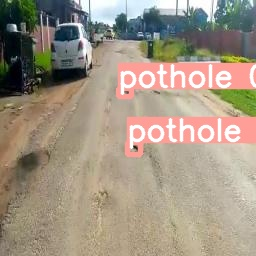



/content/yolov5/runs/detect/exp2/466_png_jpg.rf.daeff55a8d0c6c316da4df5e4d6c3034.jpg


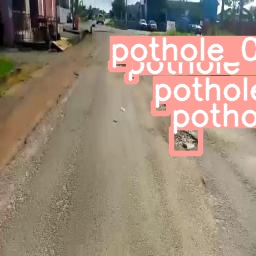



/content/yolov5/runs/detect/exp2/img-619_jpg.rf.cf0f82ca6b9d86a82e5031afb84160a4.jpg


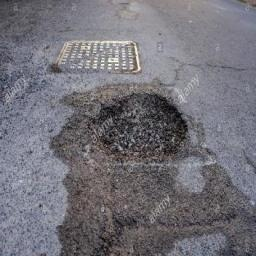



/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac43e84_d20170301_m025654_c001_v0001036_t0016_png_jpg.rf.894a5e33397cf0edf73be890fa4cc11c.jpg
/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f105a08c5cac60234_d20161224_m024113_c001_v0001030_t0020_png_jpg.rf.2e50f6607cf693860041c1ebcfff775c.jpg
/content/yolov5/runs/detect/exp2/img-591_jpg.rf.9f7aab8620ff6014dab3043def393bcd.jpg
/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac44cc3_d20170301_m034425_c001_v0001036_t0016_png_jpg.rf.db133cc10de243d5be6f3679ac1ddf72.jpg
/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f110e5e48fac44cc3_d20170301_m034425_c001_v0001036_t0016_png_jpg.rf.12fa8e69cce837dd61accc3200515acd.jpg
/content/yolov5/runs/detect/exp2/684_png_jpg.rf.8cdd83f7518f43045c15facb795bef14.jpg
/content/yolov5/runs/detect/exp2/4_z8126b7d060d92d74599e0618_f109cae5016f23e5c_d20170225_m205054_c001_v0001038_t0018_png_jpg.rf.9dd53120df270705b5813585d2e64b2e.jpg
/co

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    i += 1
    print(imageName)
    if i < 50:
      display(Image(filename=imageName))
      print("\n")

## Save Model

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>